In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [17]:
data = pd.read_csv('chrome.csv')

data.head()

,x,y,color
0,317.614913,197.197881,2
1,187.085153,164.653509,0
2,245.989615,233.783184,2
3,356.170303,206.712568,2
4,424.640194,141.090956,1


In [18]:
y = data.color

In [19]:
data.drop(columns=['color'], axis=1, inplace=True)

data.head()

,x,y
0,317.614913,197.197881
1,187.085153,164.653509
2,245.989615,233.783184
3,356.170303,206.712568
4,424.640194,141.090956


In [20]:
data.describe()

,x,y
count,11093.000000,11093.000000
mean,299.703953,204.167812
std,65.249404,67.561248
min,166.275945,72.208871
25%,255.829469,154.127105
50%,294.328576,200.136526
75%,346.941514,250.415676
max,438.530176,339.047113


In [21]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11093 entries, 0 to 11092
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   x       11093 non-null  float64
 1   y       11093 non-null  float64
dtypes: float64(2)
memory usage: 173.5 KB


array([[<AxesSubplot: title={'center': 'x'}>,
        <AxesSubplot: title={'center': 'y'}>]], dtype=object)

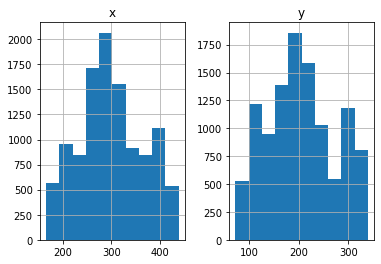

In [23]:
data.hist()

<AxesSubplot: >

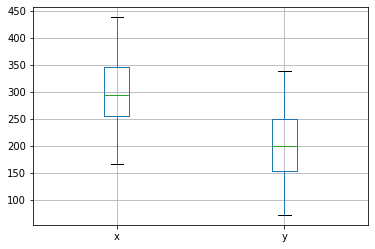

In [24]:
data.boxplot()

In [25]:
from sklearn.preprocessing import MinMaxScaler


x = data.values
scaler = MinMaxScaler()
x_scaled = scaler.fit_transform(x)
data = pd.DataFrame({'x': x_scaled[:, 0], 'y':x_scaled[:, 1]})

data.head()

,x,y
0,0.555874,0.468407
1,0.076433,0.346444
2,0.292791,0.605514
3,0.697489,0.504065
4,0.948982,0.258142


In [37]:
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans


models = []
score1 = [] 
score2 = []

for i in range(2, 10):
    model = KMeans(n_clusters=i, init='k-means++').fit(data)
    models.append(model)
    score1.append(model.inertia_)
    score2.append(silhouette_score(data, model.labels_))

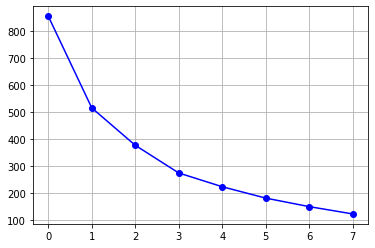

In [38]:
plt.grid(True)
plt.plot(score1, 'bo-',)
plt.show()

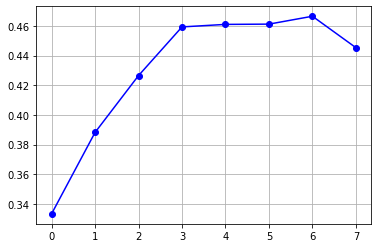

In [39]:
plt.grid(True)
plt.plot(score2, 'bo-',)
plt.show()

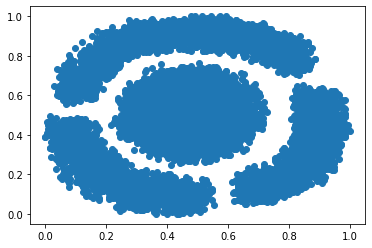

In [42]:
plt.scatter(x=data.x, y=data.y)

In [48]:
from time import time


def time_wrapper(func):
    def func_wrapper(*args, **kwargs):
        time1 = time()
        result = func(*args, **kwargs)
        time2 = time()
        print(f'Function {func.__name__!r} executed in {time2 - time1}')
        return result
    return func_wrapper

In [77]:
@time_wrapper
def kmeans_func():
    model = KMeans(n_clusters=4, init='k-means++')
    model.fit(data)
    return model

In [78]:
model = kmeans_func()

model.cluster_centers_

Function 'kmeans_func' executed in 0.15159392356872559


array([[0.82711251, 0.3178304 ],
       [0.43382981, 0.51883315],
       [0.49470841, 0.86016562],
       [0.24642144, 0.21581111]])

In [79]:
model.labels_

array([1, 3, 1, ..., 2, 1, 1])

In [80]:
import plotly.graph_objects as go

fig = go.Figure(data=[go.Scatter3d(x=data['x'], y=data['y'], 
                                   z=np.array([0.0] * len(data)),
                                  mode='markers', 
                                   marker_color=model.labels_, 
                                   marker_size=4)])

fig.show()

In [82]:
from scipy.cluster.hierarchy import dendrogram, linkage


@time_wrapper
def linkage_func():
    model = linkage(data, method='ward', metric='euclidean')
    return model

In [83]:
model_1 = linkage_func()

Function 'linkage_func' executed in 3.2463715076446533


In [84]:
model_1

array([[1.47400000e+03, 3.08300000e+03, 2.88625792e-05, 2.00000000e+00],
       [3.40000000e+03, 8.74500000e+03, 4.65798315e-05, 2.00000000e+00],
       [1.01000000e+02, 7.80600000e+03, 5.52466105e-05, 2.00000000e+00],
       ...,
       [2.21770000e+04, 2.21810000e+04, 1.94408064e+01, 6.90500000e+03],
       [2.21800000e+04, 2.21820000e+04, 2.70665202e+01, 8.97800000e+03],
       [2.21780000e+04, 2.21830000e+04, 2.83927488e+01, 1.10930000e+04]])

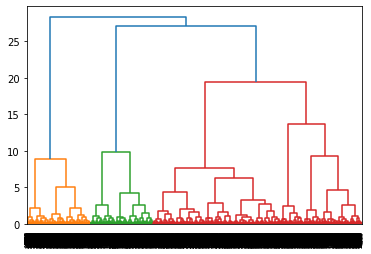

In [85]:
plt.show(dendrogram(model_1))

In [93]:
from sklearn.cluster import AgglomerativeClustering as AC


@time_wrapper
def AC_func():
    model = AC(4, compute_distances=True).fit(data)
    return model

In [94]:
model_2 = AC_func()

model_2.labels_

Function 'AC_func' executed in 3.1825249195098877


array([3, 2, 3, ..., 3, 3, 3], dtype=int64)

In [95]:
import plotly.graph_objects as go

fig = go.Figure(data=[go.Scatter3d(x=data['x'], y=data['y'], 
                                   z=np.array([0.0] * len(data)),
                                  mode='markers', 
                                   marker_color=model_2.labels_, 
                                   marker_size=4)])

fig.show()

In [177]:
from sklearn.cluster import DBSCAN


@time_wrapper
def DB_func():
    model = DBSCAN(eps=0.04, min_samples=2, algorithm='kd_tree').fit(data)
    return model

In [178]:
model_3 = DB_func()

model_3.labels_

Function 'DB_func' executed in 0.13463830947875977


array([0, 1, 0, ..., 0, 0, 0], dtype=int64)

In [179]:
len(set(model_3.labels_))

4

In [180]:
import plotly.graph_objects as go

fig = go.Figure(data=[go.Scatter3d(x=data['x'], y=data['y'], 
                                   z=np.array([0.0] * len(data)),
                                  mode='markers', 
                                   marker_color=model_3.labels_, marker_size=4)])

fig.show()

In [197]:
from sklearn.manifold import TSNE


@time_wrapper
def tsne_func():
    model = TSNE(n_components=3).fit_transform(data)
    return model

In [198]:
model_4 = tsne_func()

C:\Users\Egor\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

C:\Users\Egor\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



Function 'tsne_func' executed in 70.52048921585083


In [200]:
import plotly.express as px


fig = px.scatter_3d(
    model_4, x=0, y=1, z=2,
    color=y,
)
fig.update_traces(marker_size=8)
fig.show()

In [211]:
@time_wrapper
def tsne_func_2d():
    model = TSNE(n_components=2, perplexity=100).fit_transform(data)
    return model

In [212]:
model_5 = tsne_func_2d()

C:\Users\Egor\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

C:\Users\Egor\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



Function 'tsne_func_2d' executed in 56.0934956073761


In [213]:
import plotly.express as px


fig = px.scatter(
    model_5, x=0, y=1,
    color=y,
)
fig.update_traces(marker_size=8)
fig.show()

In [204]:
from umap import UMAP


@time_wrapper
def umap_func():
    model = UMAP(n_components=3, ).fit_transform(data)
    return model

In [205]:
model_6 = umap_func()

model_6

Function 'umap_func' executed in 20.151281595230103


array([[ 7.558857  , -0.9750683 ,  5.062862  ],
       [15.389558  ,  9.079885  ,  5.4641957 ],
       [ 9.482443  ,  7.2851315 ,  3.2042387 ],
       ...,
       [ 9.2292185 ,  6.459073  ,  0.09317236],
       [ 8.642883  ,  1.0801017 , 11.342038  ],
       [ 9.498215  ,  6.8974648 ,  3.0593913 ]], dtype=float32)

In [206]:
import plotly.express as px


fig = px.scatter_3d(
    model_6, x=0, y=1, z=2,
    color=y,
)
fig.update_traces(marker_size=8)
fig.show()

In [207]:
from umap import UMAP


@time_wrapper
def umap_func_2d():
    model = UMAP(n_components=2, ).fit_transform(data)
    return model

In [208]:
model_7 = umap_func_2d()

model_7

Function 'umap_func_2d' executed in 4.7689433097839355


array([[ 6.2394385, -2.0250266],
       [16.857782 , 10.223923 ],
       [12.183488 ,  6.2939777],
       ...,
       [10.384935 ,  8.016217 ],
       [10.725216 , -3.2405171],
       [11.677569 ,  6.2252207]], dtype=float32)

In [210]:
import plotly.express as px


fig = px.scatter(
    model_7, x=0, y=1,
    color=y,
)
fig.update_traces(marker_size=8)
fig.show()

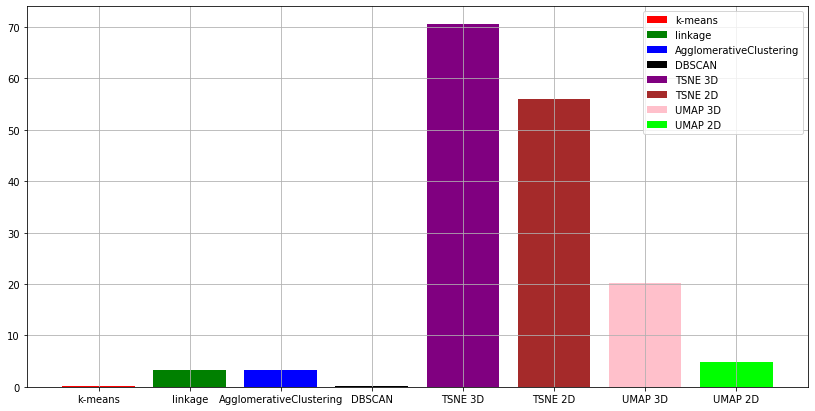

In [259]:
labels = ['k-means', 'linkage', 'AgglomerativeClustering', 'DBSCAN',
         'TSNE 3D', 'TSNE 2D', 'UMAP 3D', 'UMAP 2D']
x = [0.15159392356872559, 3.2463715076446533, 3.1825249195098877, 
    0.13463830947875977, 70.52048921585083, 56.0934956073761, 
    20.151281595230103, 4.7689433097839355]
color = ['r', 'g', 'b', 'black', 'purple', 'brown', 'pink', 'lime']

plt.figure(figsize=(14, 7))
plt.grid()
plt.bar(labels, x, label=labels, color=color)
plt.legend(prop={'size': 10})
plt.show()